<a href="https://colab.research.google.com/github/GKS07/Computer_Vision/blob/main/Flowers_calssification_using__TL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Flower Recognition(Classifier)**

**This dataset contains of 5 types of flowers:**

*   daisy
*   dandelion
*   rose
*   sunflower
*   Tulip

I'll create the CNN model to classify the flowers using colab GPU hardware.

## Connecting to Drive and Downloading the data from kaggle.

In [1]:
#downloading the data.


# uploading the kaggle jason file
from google.colab import files
files.upload()

# copying the kaggle file

!mkdir ~/.kaggle # nmaking the folder

! cp kaggle.json ~/.kaggle/  #copy the file

#changing the permission.
! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# downloading the data from kaggle

!kaggle datasets download -d imsparsh/flowers-dataset

# making the folder
!mkdir Flowers_data


 92% 189M/205M [00:01<00:00, 150MB/s]
100% 205M/205M [00:01<00:00, 158MB/s]


In [ ]:
#unzipping the data

!unzip flowers-dataset.zip -d Flowers_data

In [5]:
# importing the Libraries

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import matplotlib.image as mpimg
%matplotlib inline
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

print(tf.__version__)

2.15.0


# Importing the Flowers Dataset


**Training data contains**

*   646 Dandelion's
*   607 Tulip's
*   495 Sunflowers
*   501 Daisy
*   497 Roses

Total training data contains 2746 flowers.


**Test data**

it contains 924 flowers of diffrent types.


In [6]:
# daefining the folder path

training_path = '/content/Flowers_data/train'

test_path = '/content/Flowers_data/test'

In [7]:
for sub_dir in os.listdir(training_path):
    img_file = os.listdir(os.path.join(training_path,sub_dir))
    print(sub_dir)
    print("The number of",sub_dir,"is:", len(img_file))

dandelion
The number of dandelion is: 646
tulip
The number of tulip is: 607
sunflower
The number of sunflower is: 495
daisy
The number of daisy is: 501
rose
The number of rose is: 497


In [8]:
test_f = []
for img in os.listdir(test_path):
    test_f.append(img)
print("the no of flowers in test folder is:",len(test_f))

the no of flowers in test folder is: 924


# Preprocessing the Data

5 classes:
['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


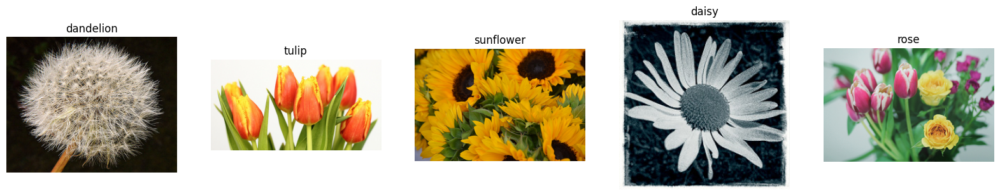

In [9]:
# Get the class names

classes = os.listdir(training_path)
classes.sort()
print(len(classes), 'classes:')
print(classes)

# Show the first image in each folder
fig = plt.figure(figsize=(20, 60))
i = 0
for sub_dir in os.listdir(training_path):
    i+=1
    img_file = os.listdir(os.path.join(training_path,sub_dir))[0]
    img_path = os.path.join(training_path, sub_dir, img_file)
    img = mpimg.imread(img_path)
    a=fig.add_subplot(1, len(classes),i)
    a.axis('off')
    imgplot = plt.imshow(img)
    a.set_title(sub_dir)
plt.show()

In [10]:
# Creating a training and validation data.

# defining some parameter

batch_size = 32
img_size = 180

#data augmentaion

aug_data_model = tf.keras.Sequential([layers.Resizing(img_size, img_size),
                                layers.Rescaling(1./255),
                                layers.RandomFlip("horizontal_and_vertical"),
                                layers.RandomRotation(0.2),
                                layers.RandomZoom(height_factor = (0.3, 0.4),width_factor = (0.3, 0.4),fill_mode='reflect',interpolation='bilinear',fill_value=0.0),
                                layers.RandomTranslation(height_factor = 0.3, width_factor = 0.3, fill_mode='reflect', interpolation='bilinear', fill_value=0.0),
                                layers.RandomContrast(factor = 0.2),
                                layers.RandomBrightness(factor = 0.2)])

#generating data
img_data_generator = ImageDataGenerator(shear_range = 0.2,
                                        rescale = 1./255.,
                                        zoom_range = 0.2,
                                        horizontal_flip = True,
                                        vertical_flip = True,
                                        #interpolation_order=1,
                                        fill_mode = 'nearest',
                                        rotation_range = 20,
                                        width_shift_range = 0.2,
                                        height_shift_range = 0.2,
                                        validation_split = 0.2)

#generating a training data
training_data = img_data_generator.flow_from_directory('/content/Flowers_data/train',

                                                       target_size = (img_size, img_size),
                                                       color_mode = 'rgb',
                                                       batch_size = batch_size,
                                                       class_mode = 'categorical',
                                                       shuffle = True,
                                                       seed = 123,
                                                       subset = 'training')

#generating the validation data

validation_data = img_data_generator.flow_from_directory('/content/Flowers_data/train',
                                                         target_size = (img_size, img_size),

                                                         color_mode = 'rgb',
                                                         batch_size = batch_size,
                                                         class_mode = 'categorical',
                                                         subset = 'validation')

Found 2198 images belonging to 5 classes.
Found 548 images belonging to 5 classes.


In [11]:
#indeces of the class

training_data.class_indices

{'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}

In [12]:
print("the shape of the image is:",training_data.image_shape)

the shape of the image is: (180, 180, 3)


In [13]:
class_ = training_data.num_classes
print("the diffrent number of flowers in data is:", class_)

the diffrent number of flowers in data is: 5


In [14]:
# defining the function to display the images.

CLASSES = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

def display_one_flower(image, title, subplot, color):
  plt.subplot(subplot)
  plt.axis('off')
  plt.imshow(image)
  plt.title(title, fontsize=16, color=color)

# plotting the 9 images
def display_nine_flowers(images, titles, title_colors=None):
  subplot = 331
  plt.figure(figsize=(20,15))
  for i in range(9):
    color = 'black' if title_colors is None else title_colors[i]
    display_one_flower(images[i], titles[i], 331+i, color)
  plt.tight_layout()
  plt.subplots_adjust(wspace=0.1, hspace=0.1)
  plt.show()

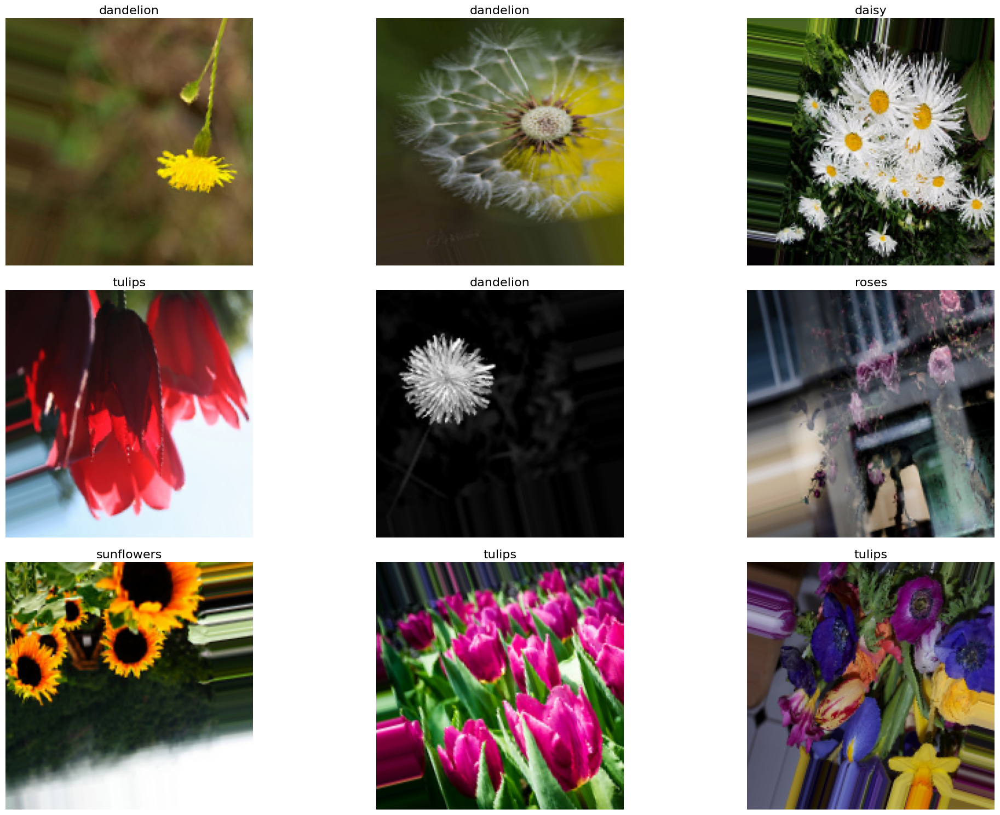

In [15]:
# displaying the training data.
images, classes = next(training_data)
class_idxs = np.argmax(classes, axis=-1) # transform from one-hot array to class number
labels = [CLASSES[idx] for idx in class_idxs]
display_nine_flowers(images, labels)

# Creating a Classifier Model



In [16]:
# importing the libraries

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout,Flatten, Dense, Rescaling
from tensorflow.keras.activations import relu, softmax

In [17]:
# enabling and testing the GPU

device_name = tf.test.gpu_device_name()
print(device_name)


with tf.device('/device:GPU:0'):

    model = Sequential([aug_data_model,
                        Rescaling(1./255),
                        Conv2D(32, 3, input_shape = training_data.image_shape , padding='same', activation='relu'),
                        MaxPooling2D(),
                        Conv2D(32, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Conv2D(64, 3, padding='same', activation='relu'),
                        MaxPooling2D(),
                        Conv2D(64,3, padding = 'same'),
                        MaxPooling2D(),
                        Dropout(0.2),
                        Flatten(),
                        Dense(128, activation='relu'),
                        Dense(128, activation = 'relu'),
                        #Dense(128, activation = 'relu'),
                        Dense(64, activation = 'relu'),
                        #Dropout(0.2),
                        Dense(class_,activation = 'softmax', name="outputs")
                        ])
    model.compile(optimizer='adam',
              loss = 'categorical_crossentropy',
              metrics=['accuracy']
              )
    epochs = 30
    # for early stopping
    callback = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 3)
    history = model.fit(training_data,
                    validation_data = validation_data,
                    callbacks=[callback],
                    verbose = 1,
                    epochs = epochs
                    )
    model.summary()



/device:GPU:0
Epoch 1/30
69/69 [==============================] - 39s 414ms/step - loss: 1.6077 - accuracy: 0.2234 - val_loss: 1.6032 - val_accuracy: 0.2354
Epoch 2/30
69/69 [==============================] - 29s 424ms/step - loss: 1.6058 - accuracy: 0.2338 - val_loss: 1.6033 - val_accuracy: 0.2354
Epoch 3/30
69/69 [==============================] - 28s 409ms/step - loss: 1.6063 - accuracy: 0.2320 - val_loss: 1.6036 - val_accuracy: 0.2354
Epoch 4/30
69/69 [==============================] - 28s 404ms/step - loss: 1.6074 - accuracy: 0.2293 - val_loss: 1.6037 - val_accuracy: 0.2354
Epoch 5/30
69/69 [==============================] - 27s 399ms/step - loss: 1.6062 - accuracy: 0.2302 - val_loss: 1.6037 - val_accuracy: 0.2354
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 180, 180, None)    0         
                                                   

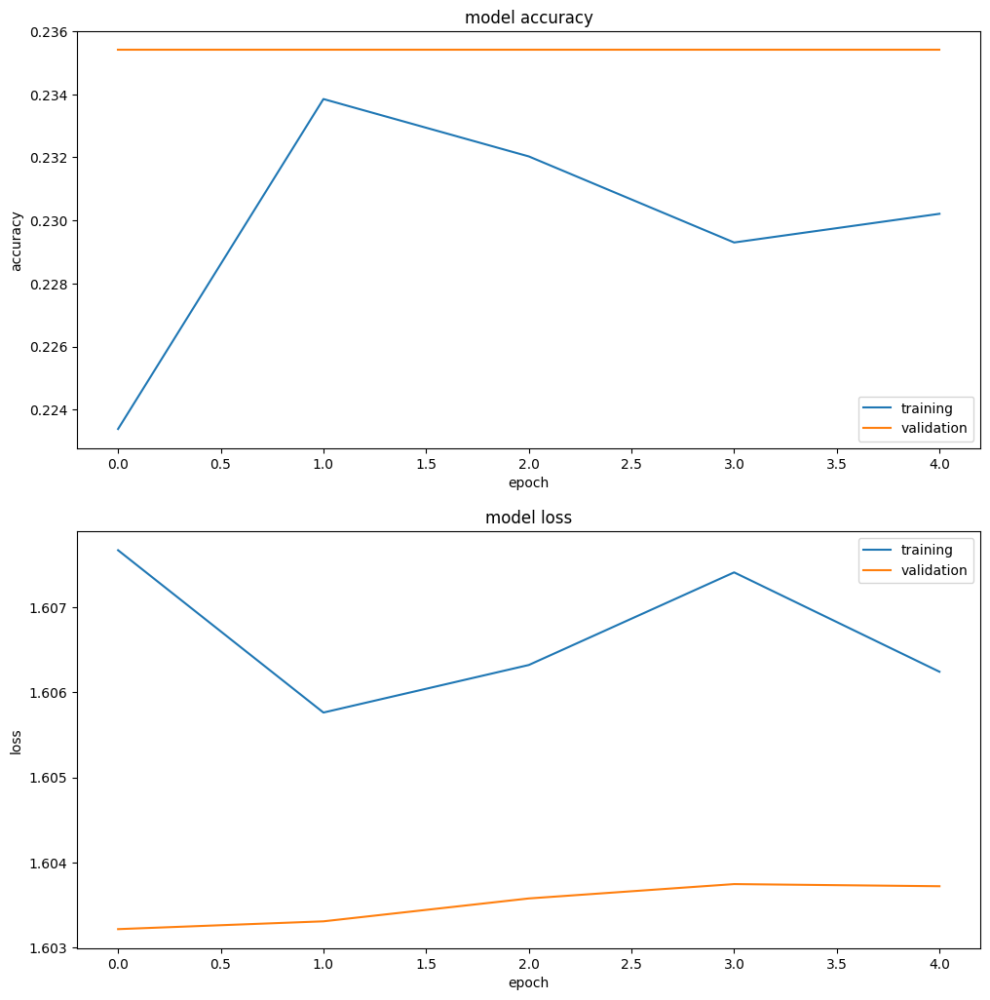

In [18]:
#displaying the training curves:

def display_training_curves(training, validation, title, subplot):
  ax = plt.subplot(subplot)
  ax.plot(training)
  ax.plot(validation)
  ax.set_title('model '+ title)
  ax.set_ylabel(title)
  ax.set_xlabel('epoch')
  ax.legend(['training', 'validation'])

plt.subplots(figsize=(10,10))
plt.tight_layout()
display_training_curves(history.history['accuracy'], history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history.history['loss'], history.history['val_loss'], 'loss', 212)

# Testing the model.

In [19]:
#defining the function to get the predicted label

def flower_title(label, prediction):
  # Both prediction (probabilities) and label (one-hot) are arrays with one item per class.
  class_idx = np.argmax(label, axis=-1)
  prediction_idx = np.argmax(prediction, axis=-1)
  if class_idx == prediction_idx:
    return f'{CLASSES[prediction_idx]} [correct]', 'green'
  else:
    return f'{CLASSES[prediction_idx]} [incorrect, should be {CLASSES[class_idx]}]', 'red'

def get_titles(images, labels, model):
  predictions = model.predict(images)
  titles, colors = [], []
  for label, prediction in zip(classes, predictions):
    title, color = flower_title(label, prediction)
    titles.append(title)
    colors.append(color)
  return titles, colors


1/1 [==============================] - 0s 134ms/step


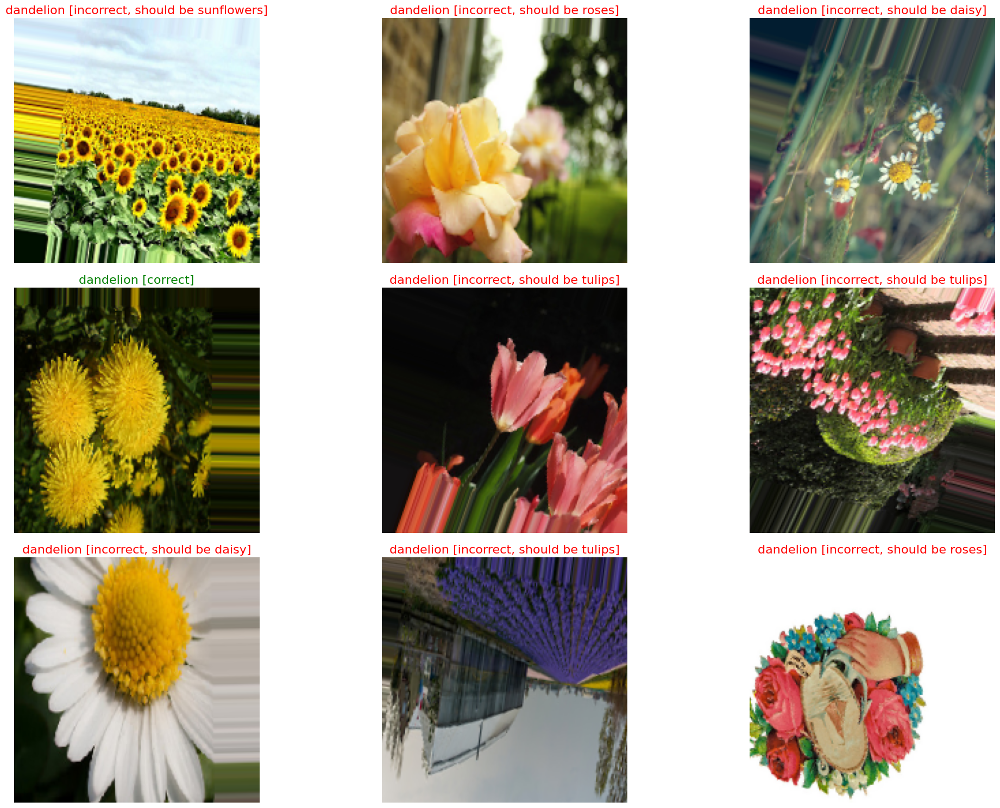

In [20]:
# displaying the predicted data.
images, classes = next(validation_data)
titles, colors = get_titles(images, classes, model)
display_nine_flowers(images, titles, colors)

In [21]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix

In [22]:
# defining function to display confusion matrix and calssification report.

import seaborn as sns
def evaluate_and_plot_confusion_matrix(model, generator):
    # Generate predictions
    y_pred = model.predict(generator)

    # Convert predictions to class labels
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Convert true labels to class labels
    y_true_classes = generator.classes

    # Get class labels
    class_labels = list(generator.class_indices.keys())

    # Calculate confusion matrix
    cm = confusion_matrix(y_true_classes, y_pred_classes)

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    # Display classification report
    print('\nClassification Report:\n', classification_report(y_true_classes, y_pred_classes, target_names=class_labels))


18/18 [==============================] - 6s 338ms/step


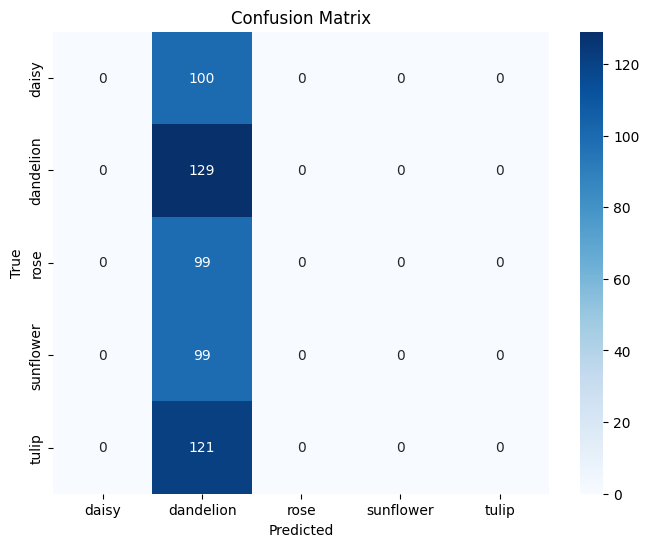


Classification Report:
               precision    recall  f1-score   support

       daisy       0.00      0.00      0.00       100
   dandelion       0.24      1.00      0.38       129
        rose       0.00      0.00      0.00        99
   sunflower       0.00      0.00      0.00        99
       tulip       0.00      0.00      0.00       121

    accuracy                           0.24       548
   macro avg       0.05      0.20      0.08       548
weighted avg       0.06      0.24      0.09       548



In [23]:
#plotting confusion matrix and calssifiaction report of  model
evaluate_and_plot_confusion_matrix(model, validation_data)

# Training on Pretrained model.**(Transfer Learning)**

**Using VGG19 for training our model.**

In [24]:
# importing the VGG19

import keras
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.optimizers import RMSprop

In [25]:
# crating the model with the help of vgg19


with tf.device('/device:GPU:0'):
  def create_model():
    pretrained_model = VGG19(input_shape = training_data.image_shape, include_top = False, weights = 'imagenet')

    #freezing the base model

    for layer in pretrained_model.layers:
      layer.trainable = False

    # creating a new model on top of pretrained model.
    #inputs = keras.Input(shape = training_data.image_shape)

    #x = pretrained_model(inputs, training = False)

    #x = layers.GlobalAveragePooling2D()(x)

    x = Flatten()(pretrained_model.output)

    x = Dense(312, activation = 'relu')(x)

    #x = Dropout(0.3)(x)

    outputs = keras.layers.Dense(5, activation = 'softmax')(x)

    model = keras.Model(pretrained_model.input, outputs)

    model.compile(
      optimizer = 'adam',
      loss = 'categorical_crossentropy',
      metrics = ['accuracy']
    )
    return model

  vgg19_model = create_model()
  vgg19_model.summary()



  epochs = 30

  # for early stopping
  callback = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 5)
  vgg19_history = vgg19_model.fit(training_data,
                    validation_data = validation_data,
                    callbacks=[callback],
                    verbose = 1,
                    epochs = epochs
                    )

  final_accuracy = vgg19_history.history["val_accuracy"][-5:]
  print("FINAL ACCURACY MEAN-5: ", np.mean(final_accuracy))

80134624/80134624 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                              

In [26]:
#displaying the training curves:

def display_training_curves(training, validation, title, subplot):
  ax = plt.subplot(subplot)
  ax.plot(training)
  ax.plot(validation)
  ax.set_title('model '+ title)
  ax.set_ylabel(title)
  ax.set_xlabel('epoch')
  ax.legend(['training', 'validation'])


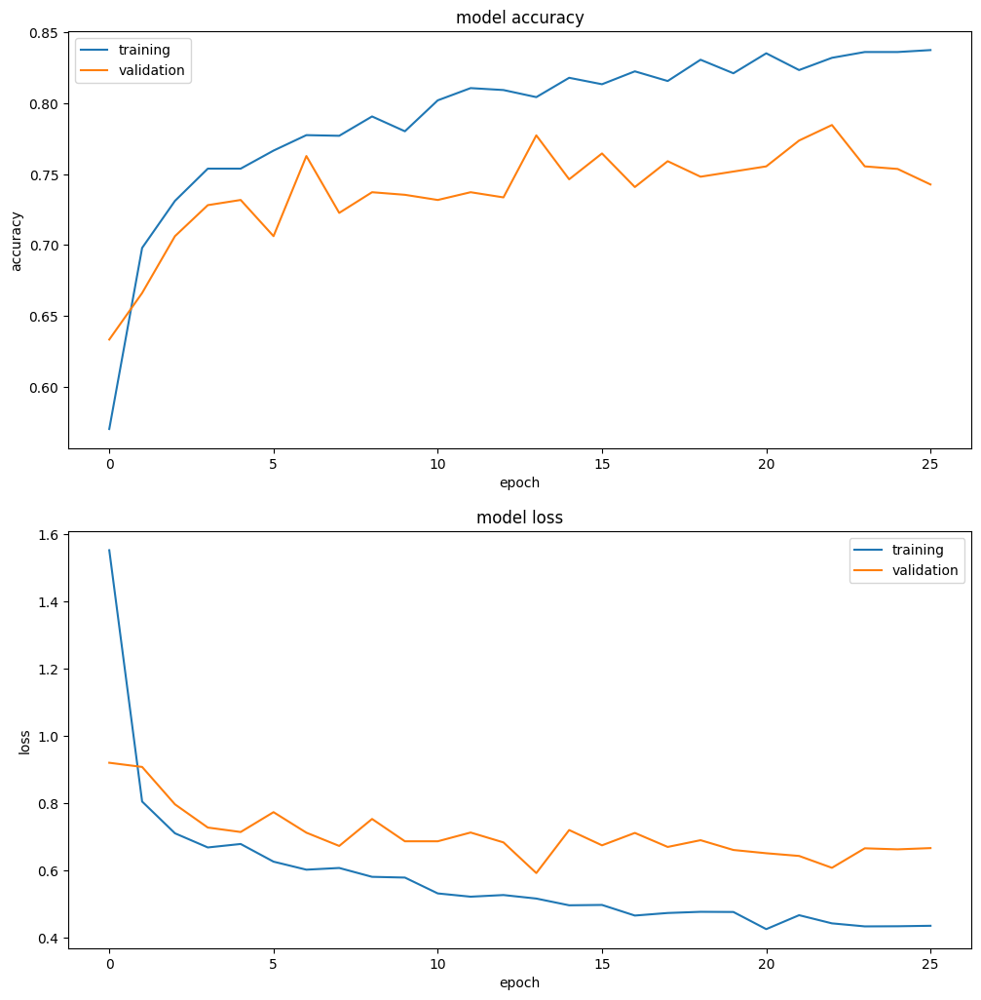

In [27]:
plt.subplots(figsize=(10,10))
plt.tight_layout()
display_training_curves(vgg19_history.history['accuracy'], vgg19_history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(vgg19_history.history['loss'], vgg19_history.history['val_loss'], 'loss', 212)

1/1 [==============================] - 0s 157ms/step


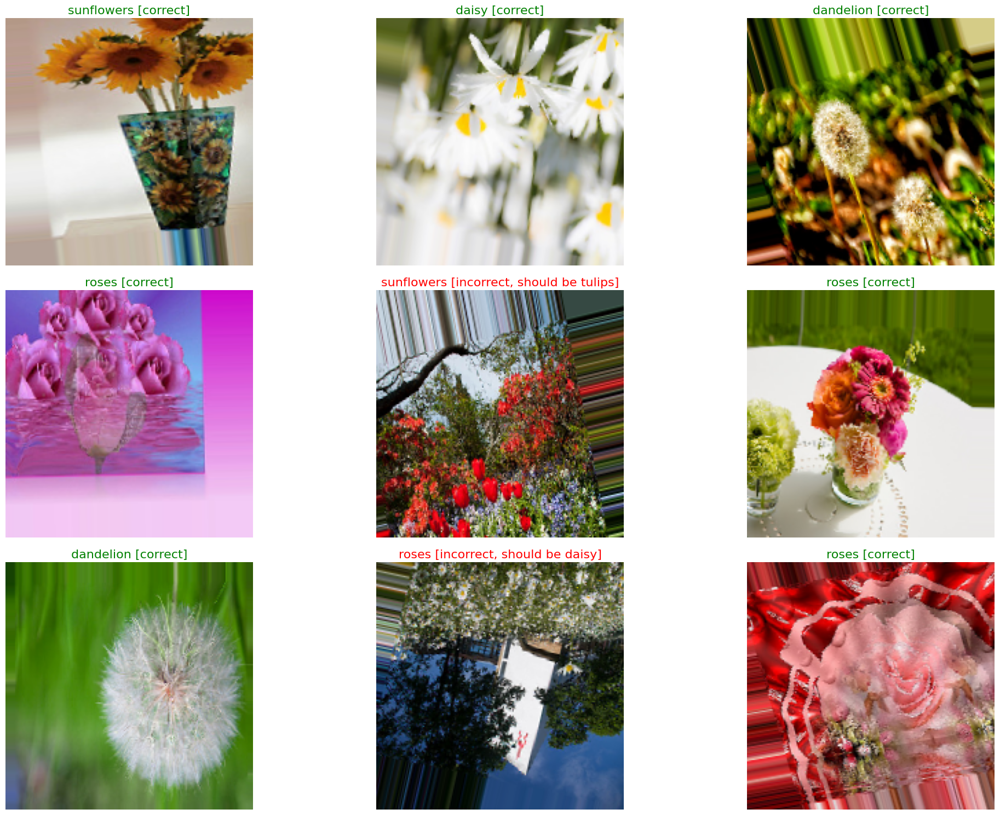

In [28]:
# displaying the predicted data of vgg19_model.
images, classes = next(validation_data)
titles, colors = get_titles(images, classes, vgg19_model)
display_nine_flowers(images, titles, colors)

18/18 [==============================] - 6s 306ms/step


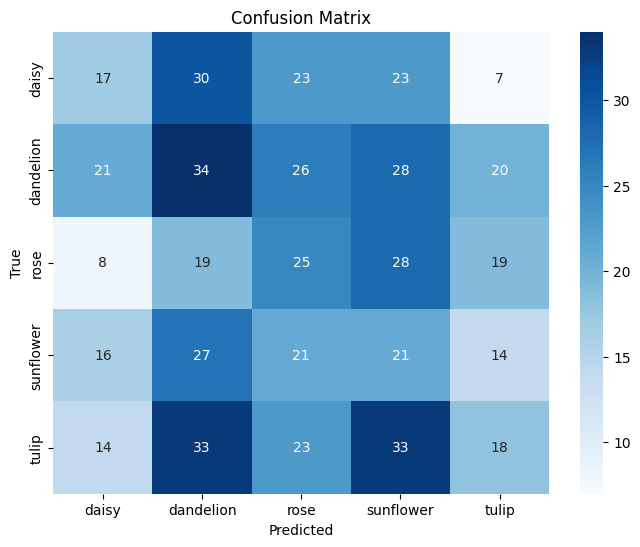


Classification Report:
               precision    recall  f1-score   support

       daisy       0.22      0.17      0.19       100
   dandelion       0.24      0.26      0.25       129
        rose       0.21      0.25      0.23        99
   sunflower       0.16      0.21      0.18        99
       tulip       0.23      0.15      0.18       121

    accuracy                           0.21       548
   macro avg       0.21      0.21      0.21       548
weighted avg       0.21      0.21      0.21       548



In [29]:
#plotting confusion matrix and calssifiaction report of inception based model
evaluate_and_plot_confusion_matrix(vgg19_model, validation_data)

# Using InceptionV3 pretrained model

In [30]:
# creating the model with inceptionv3 model

with tf.device('/device:GPU:0'):
  def create_inc_model():

    base_model2 = InceptionV3(input_shape = training_data.image_shape,
                              include_top = False,
                              weights = 'imagenet')

    #freezing the base model

    base_model2.trainable = False

    x = Flatten()(base_model2.output)

    x = Dense(1024, activation  = 'relu')(x)

    x = Dropout(0.2)(x)

    x = Dense(1024, activation = 'relu')(x)

    #final layer
    x = Dense(5, activation = 'softmax')(x)

    model = keras.Model(base_model2.input, x)

    model.compile(optimizer = RMSprop(lr = 0.0001),
                  loss = 'categorical_crossentropy',
                  metrics = ['accuracy'])

    return model

  inception_model = create_inc_model()
  inception_model.summary()


  epochs = 30

  callback = tf.keras.callbacks.EarlyStopping(monitor = 'loss',
                                              patience = 5)
  inception_history = inception_model.fit(training_data,
                                          validation_data = validation_data,
                                          callbacks = [callback],
                                          verbose = 1,
                                          epochs = epochs)

  final_accuracy = inception_history.history["val_accuracy"][-5:]
  print("FINAL ACCURACY (MEAN of last five val_accuracy): ", np.mean(final_accuracy))

87910968/87910968 [==============================] - 0s 0us/step


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 180, 180, 3)]        0         []                            
                                                                                                  
 conv2d_4 (Conv2D)           (None, 89, 89, 32)           864       ['input_2[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 89, 89, 32)           96        ['conv2d_4[0][0]']            
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 89, 89, 32)           0         ['batch_normalization[0]

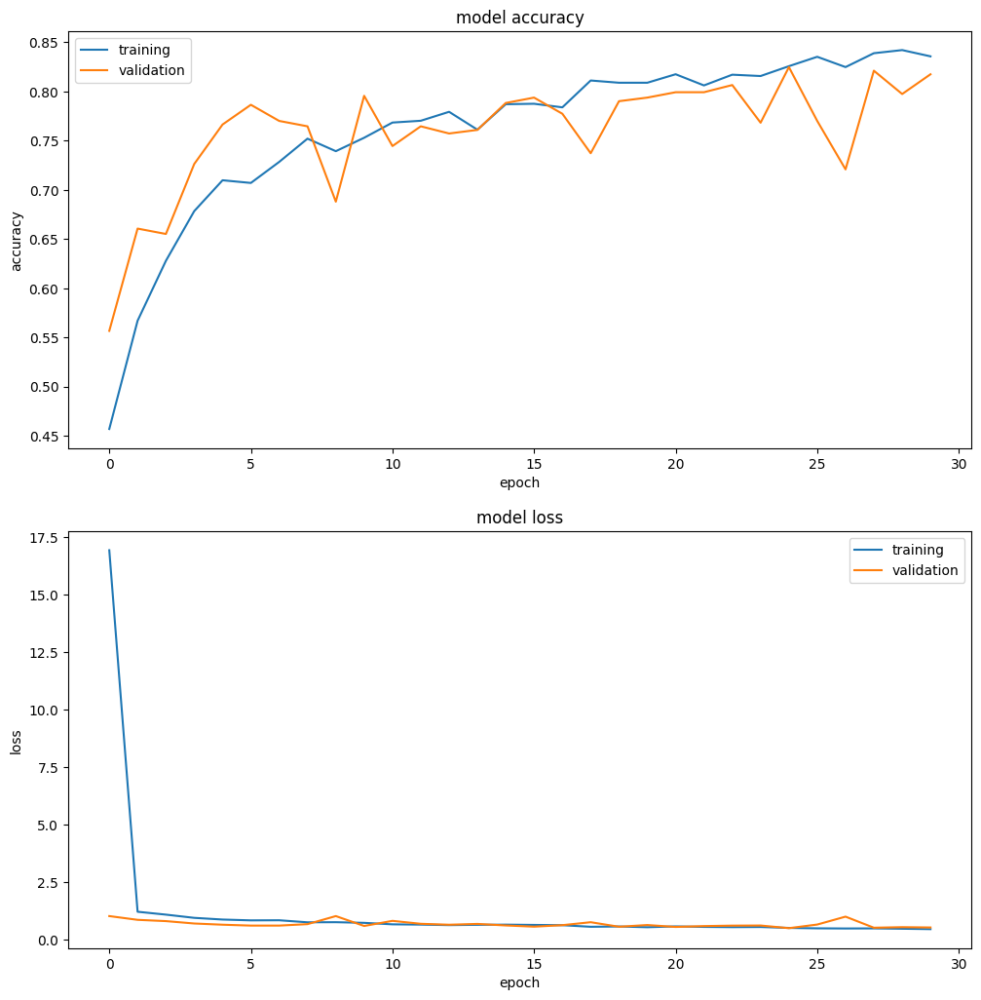

In [31]:
# predicting the data and visualizing them.

plt.subplots(figsize=(10,10))
plt.tight_layout()
display_training_curves(inception_history.history['accuracy'], inception_history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(inception_history.history['loss'], inception_history.history['val_loss'], 'loss', 212)

1/1 [==============================] - 2s 2s/step


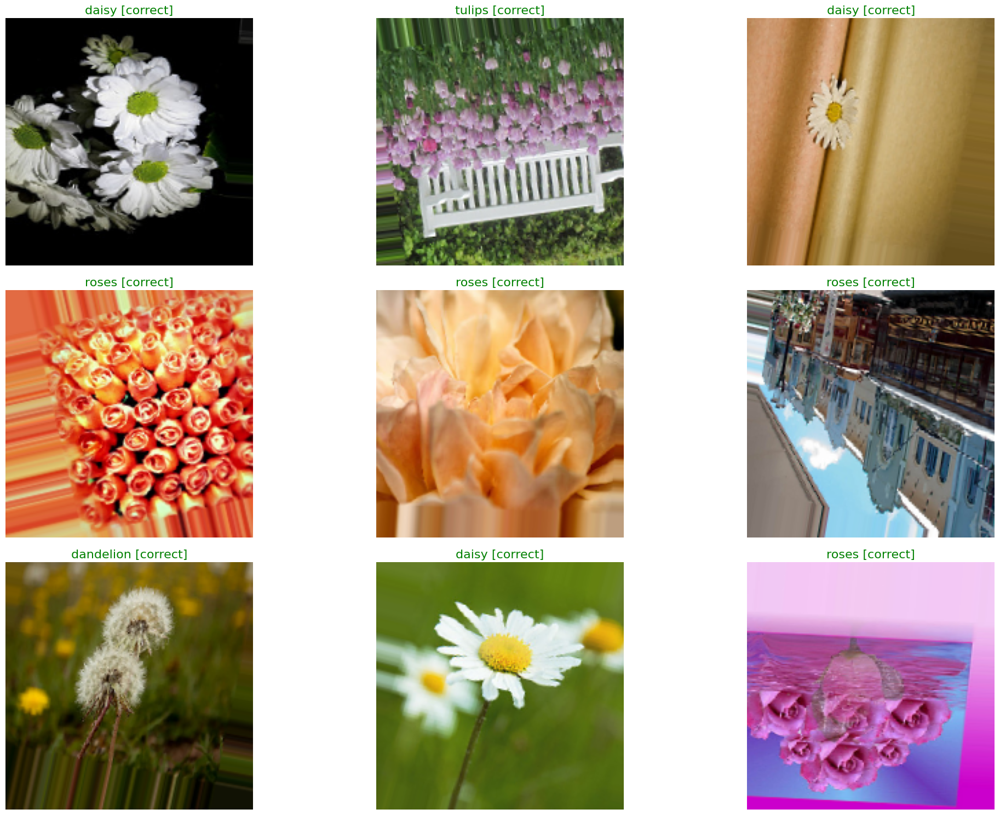

In [32]:
# displaying the predicted data of vgg19_model.
images, classes = next(validation_data)
titles, colors = get_titles(images, classes, inception_model)
display_nine_flowers(images, titles, colors)

18/18 [==============================] - 6s 266ms/step


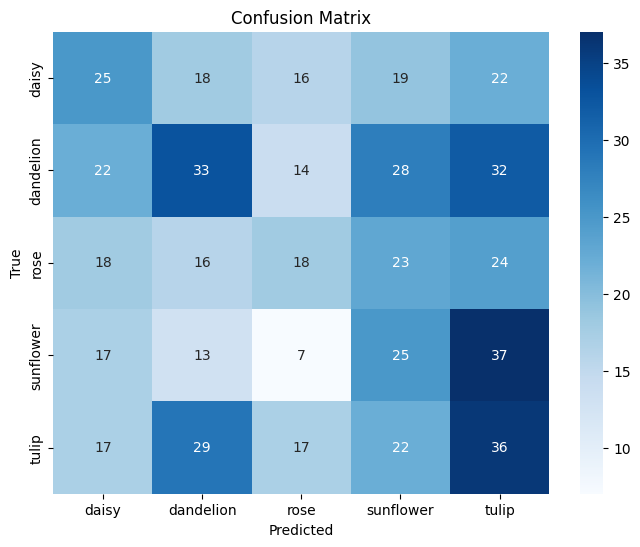


Classification Report:
               precision    recall  f1-score   support

       daisy       0.25      0.25      0.25       100
   dandelion       0.30      0.26      0.28       129
        rose       0.25      0.18      0.21        99
   sunflower       0.21      0.25      0.23        99
       tulip       0.24      0.30      0.26       121

    accuracy                           0.25       548
   macro avg       0.25      0.25      0.25       548
weighted avg       0.25      0.25      0.25       548



In [33]:
#plotting confusion matrix and calssifiaction report of inception based model
evaluate_and_plot_confusion_matrix(inception_model, validation_data)

In [34]:
 # saving our top model.

from keras.models import load_model
inception_model.save("Flowers_classifocation_model.h5")

